# AI System Implementation -  training and save model & evidence

- dataset: food101
- model: InceptionV3

## Importing Library

In [1]:
import math
import time
import requests
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
from io import BytesIO
import tensorflow as tf
from datetime import datetime
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D

## Downloading dataset

In [2]:
dataset_name = "food101"
train_dataset = tfds.load(dataset_name, split="train", as_supervised=True)
test_dataset = tfds.load(dataset_name, split="validation", as_supervised=True)  # Using predefined test set
info = tfds.builder(dataset_name).info

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.D9PQBH_2.0.0/food101-train.tfrecord*...:   0%|         …

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.D9PQBH_2.0.0/food101-validation.tfrecord*...:   0%|    …

Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.


## Understanding the dataset

In [3]:
info

tfds.core.DatasetInfo(
    name='food101',
    full_name='food101/2.0.0',
    description="""
    This dataset consists of 101 food categories, with 101'000 images. For each class, 250 manually reviewed test images are provided as well as 750 training images. On purpose, the training images were not cleaned, and thus still contain some amount of noise. This comes mostly in the form of intense colors and sometimes wrong labels. All images were rescaled to have a maximum side length of 512 pixels.
    """,
    homepage='https://data.vision.ee.ethz.ch/cvl/datasets_extra/food-101/',
    data_dir='/root/tensorflow_datasets/food101/2.0.0',
    file_format=tfrecord,
    download_size=4.65 GiB,
    dataset_size=4.77 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=101),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    nondeterministic_order=False,
    split

In [4]:
# Get label names
labels = info.features['label'].names
CLASSES = len(labels)  # Total classes in dataset

print(f"Label names: {labels}")
print(f"Total classes: {CLASSES}")

Label names: ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheesecake', 'cheese_plate', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macaron

## Visaulizing Sample Images

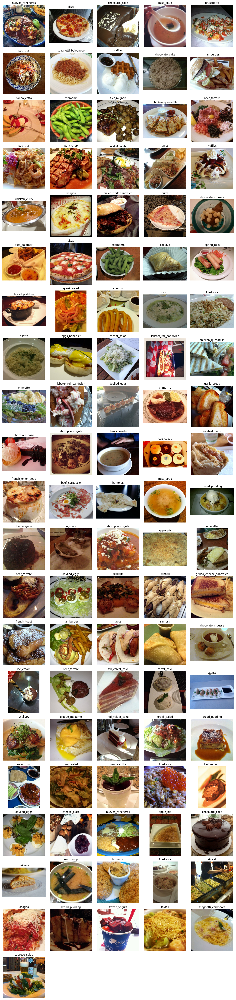

In [5]:
# Dynamically determine the grid size for plotting
cols = min(CLASSES, 5)  # Max 5 columns for better layout
rows = math.ceil(CLASSES / cols)

# Create visualization grid
plt.figure(figsize=(cols * 3, rows * 3))  # Adjust figure size dynamically
for i, (image, label) in enumerate(train_dataset.take(CLASSES)):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(image.numpy().astype('uint8'))
    plt.title(labels[label.numpy()])
    plt.axis('off')

plt.tight_layout()
plt.show()

## Shuffle before Splitting

In [6]:
# Shuffle before splitting (Ensures random train/validation split)
train_dataset = train_dataset.shuffle(10000, reshuffle_each_iteration=False)

## Dataset Splitting

In [7]:
train_split = 0.8

# Get full dataset size dynamically
full_train_size = info.splits['train'].num_examples
train_size = int(train_split * full_train_size)  # 80% of the dataset
val_size = full_train_size - train_size  # Remaining 20%

# Split the dataset
train_ds = train_dataset.take(train_size)  # Take first 80%
val_ds = train_dataset.skip(train_size)  # Skip first 80%, keep last 20%
test_ds = test_dataset

test_size = info.splits['validation'].num_examples  # Get test set size

print(f"Train set size: {train_size}")
print(f"Validation set size: {val_size}")
print(f"Test set size: {test_size}")

Train set size: 60600
Validation set size: 15150
Test set size: 25250


## Feature engineering & Data Augmentation

### Standardizing & Normalizing Pixel Values

In [8]:
# Normalize pixel values to [0,1]
def normalize(image, label):
    image = tf.image.convert_image_dtype(image, tf.float32)  # Converts from [0, 255] → [0, 1]
    return image, label

### Common Augmentations for Image Classification

In [9]:
# Define augmentation function
def augment(image, label):
    image = tf.image.random_flip_left_right(image)  # Flip images horizontally
    image = tf.image.random_brightness(image, max_delta=0.2)  # Adjust brightness
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)  # Contrast
    image = tf.image.random_saturation(image, lower=0.8, upper=1.2)  # Saturation
    return image, label

### Optimized Data Pipeline

In [10]:
AUTOTUNE = tf.data.experimental.AUTOTUNE  # Optimized processing

## Utility Function

### Image

In [11]:
def get_image_shape(image_size, channels=3):
    return (image_size, image_size, channels)

# Function to resize images
def resize(image, label):
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

def pipeline_preprocessing():
  # Processing Dataset
  train_set = train_ds.repeat().map(resize).map(normalize).map(augment).shuffle(10000).batch(BATCH_SIZE).prefetch(AUTOTUNE)
  val_set = val_ds.repeat().map(resize).map(normalize).batch(BATCH_SIZE).prefetch(AUTOTUNE)
  test_set = test_ds.map(resize).map(normalize).batch(BATCH_SIZE).prefetch(AUTOTUNE)

  return train_set, val_set, test_set


### Model

In [12]:
def generate_model (pretraining_model, dense=256, dropout=0.6, learning_rate=1e-4):
  base_model = pretraining_model(input_shape=IMG_SHAPE, include_top=False, weights='imagenet')
  base_model.trainable = False

  # Add custom classification layers
  x = base_model.output
  x = GlobalAveragePooling2D()(x)
  x = Dense(dense, activation="relu")(x)
  x = Dropout(dropout)(x)

  output_layer = Dense(CLASSES, activation="softmax")(x)
  model = Model(inputs=base_model.input, outputs=output_layer)

  model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

  model.summary()

  return base_model, model

def fine_tune_model (base_model, model, learning_rate=1e-5):
  base_model.trainable = True

  # Recompile model with lower learning rate
  model.compile(optimizer=Adam(learning_rate=learning_rate),
                loss="sparse_categorical_crossentropy",
                metrics=["accuracy"])

  return model

In [13]:
def train_model (model, train_set, val_set):
  STEPS_PER_EPOCH = train_size // BATCH_SIZE  # Calculate number of steps per epoch
  VALIDATION_STEPS = val_size // BATCH_SIZE   # Same for validation

  early_stopping = EarlyStopping(
    monitor="val_loss",  # Stop when validation loss stops improving
    patience=5,  # Wait 5 epochs before stopping
    restore_best_weights=True  # Keep the best model
  )

  lr_scheduler = ReduceLROnPlateau(
      monitor="val_loss",
      factor=0.5,  # Reduce by half
      patience=3,  # Wait 3 epochs
      min_lr=1e-6
  )

  # Train model
  start_time = time.time()
  # Train model with early stopping
  history = model.fit(
      train_set,
      validation_data=val_set,
      epochs=EPOCHES,
      steps_per_epoch=STEPS_PER_EPOCH,
      validation_steps=VALIDATION_STEPS,
      callbacks=[early_stopping, lr_scheduler]
  )
  end_time = time.time()
  training_time = end_time - start_time

  return history, training_time, model

### Graph

In [14]:
def plot_accuracy_n_loss(history):
    # Plot accuracy and loss graphs
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label="Train Accuracy")
    plt.plot(history.history['val_accuracy'], label="Validation Accuracy")
    plt.title("Model Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label="Train Loss")
    plt.plot(history.history['val_loss'], label="Validation Loss")
    plt.title("Model Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()

    plt.show()

In [15]:
def gen_class_report(model, test_set):
  # Generate predictions on validation dataset
  # Store predictions in TensorFlow tensors (avoids NumPy conversion issues)
  STEPS = math.ceil(test_size / BATCH_SIZE)
  y_true = tf.concat([labels for _, labels in test_set], axis=0)
  y_pred = tf.argmax(model.predict(test_set, steps=STEPS), axis=1)

  # Classification Report
  print(classification_report(y_true, y_pred, target_names=labels))
  return y_true, y_pred

In [16]:
def gen_report(model, test_set, history, fine_tune_history, initial_training_time, fine_tuning_time):
  y_true, y_pred = gen_class_report(model, test_set)

  # Calculate average accuracy and loss for training and validation (before fine-tuning)
  avg_train_acc = np.mean(history.history['accuracy'])
  avg_val_acc = np.mean(history.history['val_accuracy'])
  avg_train_loss = np.mean(history.history['loss'])
  avg_val_loss = np.mean(history.history['val_loss'])

  # Calculate average accuracy and loss for training and validation (after fine-tuning)
  avg_train_acc_fine = np.mean(fine_tune_history.history['accuracy'])
  avg_val_acc_fine = np.mean(fine_tune_history.history['val_accuracy'])
  avg_train_loss_fine = np.mean(fine_tune_history.history['loss'])
  avg_val_loss_fine = np.mean(fine_tune_history.history['val_loss'])

  # Display results
  print("=== Initial Training ===")
  print(f"Average Training Accuracy: {avg_train_acc:.4f}")
  print(f"Average Validation Accuracy: {avg_val_acc:.4f}")
  print(f"Average Training Loss: {avg_train_loss:.4f}")
  print(f"Average Validation Loss: {avg_val_loss:.4f}\n")

  print("=== After Fine-Tuning ===")
  print(f"Average Training Accuracy (Fine-Tuned): {avg_train_acc_fine:.4f}")
  print(f"Average Validation Accuracy (Fine-Tuned): {avg_val_acc_fine:.4f}")
  print(f"Average Training Loss (Fine-Tuned): {avg_train_loss_fine:.4f}")
  print(f"Average Validation Loss (Fine-Tuned): {avg_val_loss_fine:.4f}")

  # Confusion Matrix
  conf_matrix = confusion_matrix(y_true, y_pred)

  plt.figure(figsize=(10, 8))
  sns.heatmap(conf_matrix, annot=True, fmt="d", xticklabels=labels, yticklabels=labels, cmap="Blues")
  plt.xlabel("Predicted Label")
  plt.ylabel("True Label")
  plt.title("Confusion Matrix")
  plt.show()

  # Display runtime performance
  print(f"Initial Training Time: {initial_training_time:.2f} seconds")
  print(f"Fine-Tuning Time: {fine_tuning_time:.2f} seconds")

  return classification_report(y_true, y_pred, target_names=labels, output_dict=True)

### Variable

In [17]:
BATCH_SIZE = 128
EPOCHES = 100

## Model

### InceptionV3

##### Build Model

In [18]:
IMG_SIZE = 260
IMG_SHAPE = get_image_shape(IMG_SIZE)

In [19]:
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input

base_model, model = generate_model(InceptionV3)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 260, 260, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 129, 129, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 129, 129, 32)   │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 129, 129, 32)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 127, 127, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 127, 127, 32)   │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 127, 127, 32)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 127, 127, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 127, 127, 64)   │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 127, 127, 64)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 63, 63, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 63, 63, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 63, 63, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 63, 63, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 61, 61, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 61, 61, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 22,353,285 (85.27 MB)

 Trainable params: 550,501 (2.10 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

##### Train Model (Before Fine-Tuning)

In [20]:
# Processing Dataset
train_set, val_set, test_set = pipeline_preprocessing()

In [21]:
history, initial_training_time, model = train_model(model, train_set, val_set)

Epoch 1/100
473/473 ━━━━━━━━━━━━━━━━━━━━ 162s 247ms/step - accuracy: 0.0104 - loss: 13.3113 - val_accuracy: 0.0098 - val_loss: 4.6168 - learning_rate: 1.0000e-04
Epoch 2/100
473/473 ━━━━━━━━━━━━━━━━━━━━ 112s 237ms/step - accuracy: 0.0100 - loss: 4.6215 - val_accuracy: 0.0095 - val_loss: 4.6156 - learning_rate: 1.0000e-04
Epoch 3/100
473/473 ━━━━━━━━━━━━━━━━━━━━ 108s 229ms/step - accuracy: 0.0091 - loss: 4.6168 - val_accuracy: 0.0089 - val_loss: 4.6159 - learning_rate: 1.0000e-04
Epoch 4/100
473/473 ━━━━━━━━━━━━━━━━━━━━ 108s 229ms/step - accuracy: 0.0097 - loss: 4.6158 - val_accuracy: 0.0090 - val_loss: 4.6150 - learning_rate: 1.0000e-04
Epoch 5/100
473/473 ━━━━━━━━━━━━━━━━━━━━ 107s 228ms/step - accuracy: 0.0113 - loss: 4.6160 - val_accuracy: 0.0080 - val_loss: 4.6153 - learning_rate: 1.0000e-04
Epoch 6/100
473/473 ━━━━━━━━━━━━━━━━━━━━ 107s 227ms/step - accuracy: 0.0104 - loss: 4.6155 - val_accuracy: 0.0081 - val_loss: 4.6154 - learning_rate: 1.0000e-04
Epoch 7/100
473/473 ━━━━━━━━━━━━━

###### Accuracy and Loss Graph

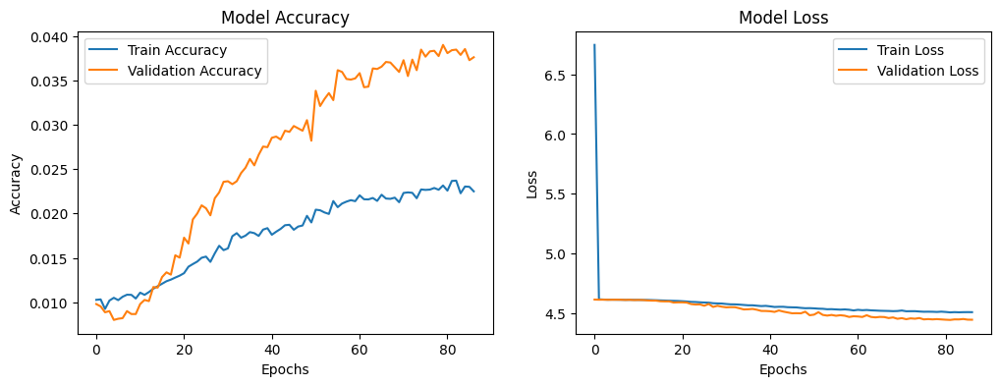

In [22]:
plot_accuracy_n_loss(history)

##### Fine-Tuning

In [23]:
model = fine_tune_model(base_model, model)

In [24]:
# Fine-tune model
fine_tune_history, fine_tuning_time, model = train_model(model, train_set, val_set)

Epoch 1/100
473/473 ━━━━━━━━━━━━━━━━━━━━ 206s 235ms/step - accuracy: 0.0133 - loss: 4.6126 - val_accuracy: 0.0626 - val_loss: 4.3019 - learning_rate: 1.0000e-05
Epoch 2/100
473/473 ━━━━━━━━━━━━━━━━━━━━ 110s 232ms/step - accuracy: 0.0478 - loss: 4.2833 - val_accuracy: 0.1831 - val_loss: 3.8295 - learning_rate: 1.0000e-05
Epoch 3/100
473/473 ━━━━━━━━━━━━━━━━━━━━ 110s 233ms/step - accuracy: 0.1146 - loss: 3.9397 - val_accuracy: 0.3103 - val_loss: 3.3666 - learning_rate: 1.0000e-05
Epoch 4/100
473/473 ━━━━━━━━━━━━━━━━━━━━ 109s 231ms/step - accuracy: 0.2052 - loss: 3.5527 - val_accuracy: 0.4185 - val_loss: 2.8858 - learning_rate: 1.0000e-05
Epoch 5/100
473/473 ━━━━━━━━━━━━━━━━━━━━ 109s 231ms/step - accuracy: 0.3077 - loss: 3.1297 - val_accuracy: 0.4852 - val_loss: 2.5358 - learning_rate: 1.0000e-05
Epoch 6/100
473/473 ━━━━━━━━━━━━━━━━━━━━ 109s 231ms/step - accuracy: 0.3847 - loss: 2.7889 - val_accuracy: 0.5361 - val_loss: 2.2399 - learning_rate: 1.0000e-05
Epoch 7/100
473/473 ━━━━━━━━━━━━━━

###### Accuracy and Loss Graph

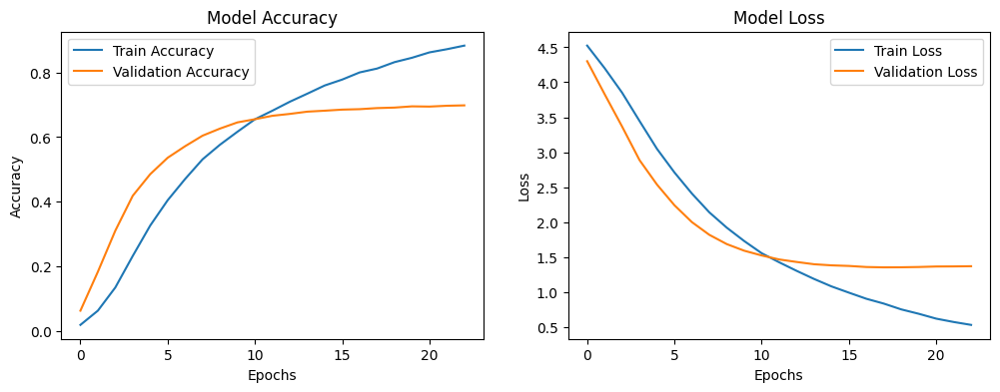

In [25]:
plot_accuracy_n_loss(fine_tune_history)

##### Evaluate Model

In [32]:
# Evaluate on Test Set
test_loss, test_acc = model.evaluate(test_set)
print(f"Test Accuracy: {test_acc*100:.4f}%")
print(f"Test Loss: {test_loss:.4f}")

198/198 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - accuracy: 0.7435 - loss: 1.0694
Test Accuracy: 74.2812%
Test Loss: 1.0854


198/198 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step
                         precision    recall  f1-score   support

              apple_pie       0.50      0.44      0.47       250
         baby_back_ribs       0.79      0.79      0.79       250
                baklava       0.80      0.84      0.82       250
         beef_carpaccio       0.71      0.78      0.74       250
           beef_tartare       0.67      0.70      0.69       250
             beet_salad       0.55      0.51      0.53       250
               beignets       0.86      0.89      0.88       250
               bibimbap       0.86      0.87      0.86       250
          bread_pudding       0.51      0.48      0.50       250
      breakfast_burrito       0.69      0.66      0.67       250
             bruschetta       0.59      0.57      0.58       250
           caesar_salad       0.80      0.78      0.79       250
                cannoli       0.87      0.85      0.86       250
          caprese_salad       0.64      0.68  

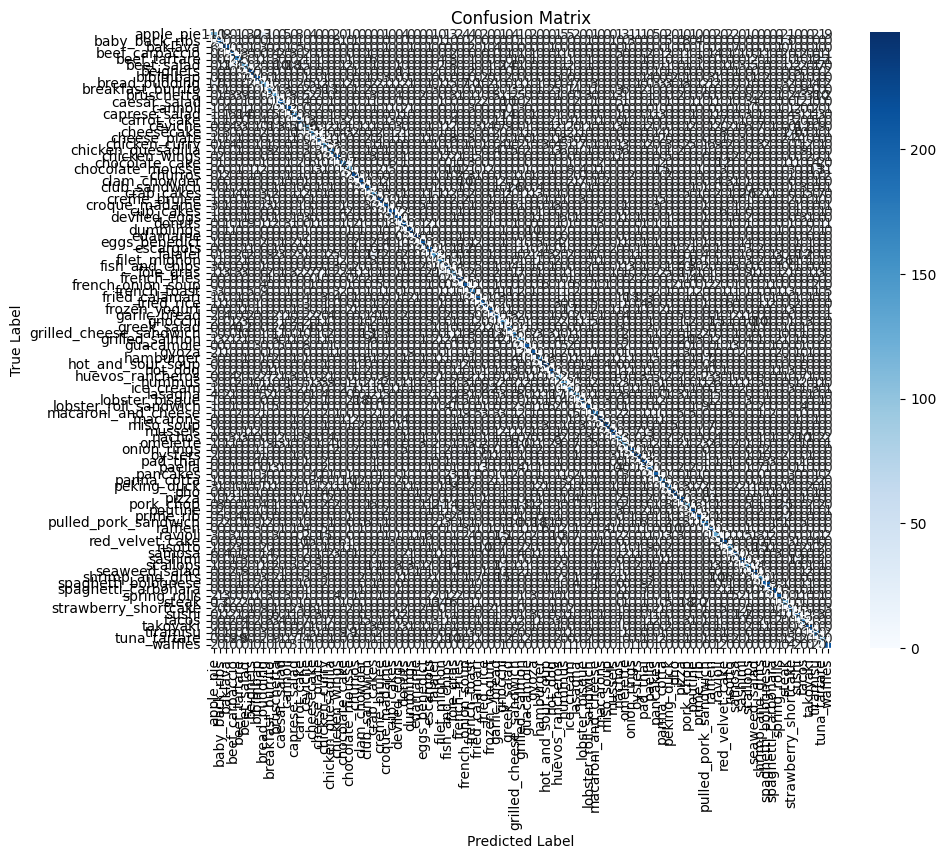

Initial Training Time: 8814.14 seconds
Fine-Tuning Time: 2614.80 seconds
Classification report saved as: classification_report_inceptionv3_20250317_002604.csv


In [26]:
class_report_dict = gen_report(model, test_set, history, fine_tune_history, initial_training_time, fine_tuning_time)

# Convert to DataFrame
class_report_df = pd.DataFrame(class_report_dict).transpose()

# Get the current date and time
date = datetime.now().strftime("%Y%m%d_%H%M%S")  # Format: YYYYMMDD_HHMMSS

filename = f"classification_report_inceptionv3_{date}.csv"

# Save to CSV
class_report_df.to_csv(filename, index=True)

print(f"Classification report saved as: {filename}")

#### Save Model

In [27]:
# Save model with timestamp
model_path = f"food101_inceptionv3_model_{date}.h5"
# model_path = f"food101_inceptionv3_model_{date}.keras"
model.save(model_path)

print(f"Model saved as: {model_path}")

Model saved as: food101_inceptionv3_model_20250317_002604.h5


### Check Saved Model

In [28]:
from tensorflow.keras.models import load_model

# Load saved model before predictions
model = load_model(model_path)

gen_class_report(model, test_set)

198/198 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step
                         precision    recall  f1-score   support

              apple_pie       0.50      0.44      0.47       250
         baby_back_ribs       0.79      0.79      0.79       250
                baklava       0.80      0.84      0.82       250
         beef_carpaccio       0.71      0.78      0.74       250
           beef_tartare       0.67      0.70      0.69       250
             beet_salad       0.55      0.51      0.53       250
               beignets       0.86      0.89      0.88       250
               bibimbap       0.86      0.87      0.86       250
          bread_pudding       0.51      0.48      0.50       250
      breakfast_burrito       0.69      0.66      0.67       250
             bruschetta       0.59      0.57      0.58       250
           caesar_salad       0.80      0.78      0.79       250
                cannoli       0.87      0.85      0.86       250
          caprese_salad       0.64      0.68  

(<tf.Tensor: shape=(25250,), dtype=int64, numpy=array([29, 81, 91, ..., 76, 31, 21])>,
 <tf.Tensor: shape=(25250,), dtype=int64, numpy=array([30, 81, 91, ..., 19, 31, 21])>)

#### Sample: Random image from test set

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


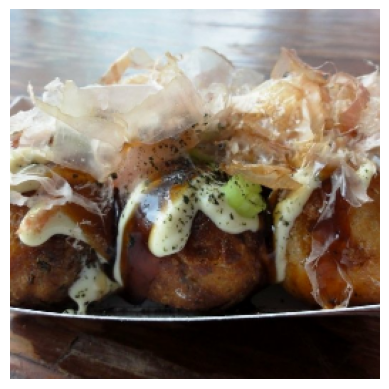

True Label: takoyaki
Predicted Class Label: takoyaki


In [37]:
# Take a single image from test_set
for image, label in test_set.shuffle(100000).take(1):
    sample_image = image.numpy()
    sample_label = label.numpy()

# Expand dimensions to match batch input shape
sample_image = np.expand_dims(sample_image[0], axis=0)

# Predict
prediction = model.predict(sample_image)
predicted_class = np.argmax(prediction, axis=1)[0]

# Display image
plt.imshow(sample_image[0].astype(np.uint8))  # Convert float image to uint8
plt.axis("off")
plt.show()

print(f"True Label: {labels[sample_label[0]]}")
print(f"Predicted Class Label: {labels[predicted_class]}")


In [34]:
# Function to preprocess the image
def preprocess_image(image):
    image = image.convert("RGB")  # Ensure RGB format
    image = image.resize((IMG_SIZE, IMG_SIZE))  # Resize to match model input
    image = np.array(image)  # Convert PIL Image to NumPy array
    image = preprocess_input(image)  # Preprocess
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

# Function to load image from URL and make predictions
def predict_from_url(image_url):
    response = requests.get(image_url)
    image = Image.open(BytesIO(response.content))

    # Display the downloaded image
    plt.figure(figsize=(4, 4))
    plt.imshow(image)
    plt.axis("off")
    plt.title("Downloaded Image")
    plt.show()

    # Preprocess and predict
    processed_image = preprocess_image(image)
    prediction = model.predict(processed_image)
    predicted_class = np.argmax(prediction, axis=1)[0]

    print(f"Predicted Class Index: {labels[predicted_class]}")


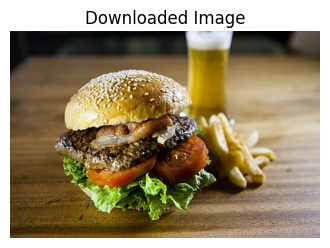

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Predicted Class Index: tuna_tartare


In [35]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0b/RedDot_Burger.jpg/480px-RedDot_Burger.jpg"
predict_from_url(image_url)

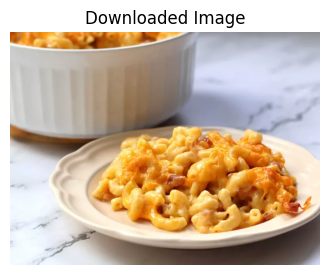

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Predicted Class Index: foie_gras


In [36]:
image_url = "https://www.allrecipes.com/thmb/_Z1EepAJWB5JSwRs-TJwRkEP0iU=/750x0/filters:no_upscale():max_bytes(150000):strip_icc():format(webp)/217193cheddar-bacon-mac-and-cheeseFranceC4x3-7d728da978d14470a1237b8094749da7.jpg"
predict_from_url(image_url)